## Setup

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/carlasanches/audio-generation.git

Cloning into 'audio-generation'...
remote: Enumerating objects: 52, done.
remote: Total 52 (delta 0), reused 0 (delta 0), pack-reused 52
Receiving objects: 100% (52/52), 44.85 MiB | 25.54 MiB/s, done.
Resolving deltas: 100% (13/13), done.


In [1]:
cd /content/audio-generation

/content/audio-generation


In [2]:
!pip install resampy
!pip install soundfile

In [2]:
import resampy
import librosa
import time
import numpy as np
import tensorflow as tf
import IPython
import IPython.display as ipd
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import soundfile as sf
from keras.optimizers import Adam

In [3]:
%matplotlib inline
matplotlib.style.use('ggplot')

In [4]:
from audioGan import *
from ganSetup import *
from ganModels import *

In [5]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'

print('Using device: ', device)

Using device:  /device:GPU:0


In [9]:
mkdir dataset

In [6]:
cd dataset

/content/audio-generation/dataset


In [11]:
! wget https://zenodo.org/records/2552860/files/FSDKaggle2018.audio_test.zip
! wget https://zenodo.org/records/2552860/files/FSDKaggle2018.audio_train.zip
! wget https://zenodo.org/records/2552860/files/FSDKaggle2018.doc.zip
! wget https://zenodo.org/records/2552860/files/FSDKaggle2018.meta.zip

--2023-11-11 20:10:26--  https://zenodo.org/records/2552860/files/FSDKaggle2018.audio_test.zip
Resolving zenodo.org (zenodo.org)... 188.185.33.206, 188.185.22.33, 188.185.10.78, ...
Connecting to zenodo.org (zenodo.org)|188.185.33.206|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 523294304 (499M) [application/octet-stream]
Saving to: ‘FSDKaggle2018.audio_test.zip’

FSDKaggle2018.audio 100%[===================>] 499.05M  33.2MB/s    in 16s     

2023-11-11 20:10:42 (31.0 MB/s) - ‘FSDKaggle2018.audio_test.zip’ saved [523294304/523294304]

--2023-11-11 20:10:42--  https://zenodo.org/records/2552860/files/FSDKaggle2018.audio_train.zip
Resolving zenodo.org (zenodo.org)... 188.185.33.206, 188.185.22.33, 188.185.10.78, ...
Connecting to zenodo.org (zenodo.org)|188.185.33.206|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4057528787 (3.8G) [application/octet-stream]
Saving to: ‘FSDKaggle2018.audio_train.zip’

FSDKaggle2018.audio 100%[=====

In [12]:
! unzip /content/audio-generation/dataset/FSDKaggle2018.audio_test.zip
! unzip /content/audio-generation/dataset/FSDKaggle2018.audio_train.zip
! unzip /content/audio-generation/dataset/FSDKaggle2018.doc.zip
! unzip /content/audio-generation/dataset/FSDKaggle2018.meta.zip

Streaming output truncated to the last 5000 lines.
  inflating: FSDKaggle2018.audio_train/79b29f52.wav  
  inflating: FSDKaggle2018.audio_train/79b31a2e.wav  
  inflating: FSDKaggle2018.audio_train/79b83450.wav  
  inflating: FSDKaggle2018.audio_train/79bb1b55.wav  
  inflating: FSDKaggle2018.audio_train/79bc77b2.wav  
  inflating: FSDKaggle2018.audio_train/79be82bb.wav  
  inflating: FSDKaggle2018.audio_train/79c2afb1.wav  
  inflating: FSDKaggle2018.audio_train/79cbc8f6.wav  
  inflating: FSDKaggle2018.audio_train/79cc9b98.wav  
  inflating: FSDKaggle2018.audio_train/79cf0f4b.wav  
  inflating: FSDKaggle2018.audio_train/79d44891.wav  
  inflating: FSDKaggle2018.audio_train/79db26c2.wav  
  inflating: FSDKaggle2018.audio_train/79e22357.wav  
  inflating: FSDKaggle2018.audio_train/79e99e49.wav  
  inflating: FSDKaggle2018.audio_train/79f04f95.wav  
  inflating: FSDKaggle2018.audio_train/79faa0c4.wav  
  inflating: FSDKaggle2018.audio_train/79fd94aa.wav  
  inflating: FSDKaggle2018.audi

In [13]:
rm /content/audio-generation/dataset/FSDKaggle2018.audio_test.zip

In [14]:
rm /content/audio-generation/dataset/FSDKaggle2018.audio_train.zip

In [15]:
rm /content/audio-generation/dataset/FSDKaggle2018.doc.zip

In [16]:
rm /content/audio-generation/dataset/FSDKaggle2018.meta.zip

## Freesound Database

In [7]:
mv /content/audio-generation/dataset/FSDKaggle2018.meta/train_post_competition.csv /content/audio-generation/dataset/train.csv

mv: cannot stat '/content/audio-generation/dataset/FSDKaggle2018.meta/train_post_competition.csv': No such file or directory


In [8]:
mv /content/audio-generation/dataset/FSDKaggle2018.meta/test_post_competition_scoring_clips.csv /content/audio-generation/dataset/test.csv

mv: cannot stat '/content/audio-generation/dataset/FSDKaggle2018.meta/test_post_competition_scoring_clips.csv': No such file or directory


In [18]:
mv /content/audio-generation/dataset/FSDKaggle2018.audio_test /content/audio-generation/dataset/audio_test

In [19]:
mv /content/audio-generation/dataset/FSDKaggle2018.audio_train /content/audio-generation/dataset/audio_train

In [9]:
train  = pd.read_csv(DATASET_PATH + "train.csv")
test = pd.read_csv(DATASET_PATH + "test.csv")
print(train.label.unique())

['Hi-hat' 'Saxophone' 'Trumpet' 'Glockenspiel' 'Cello' 'Knock'
 'Gunshot_or_gunfire' 'Clarinet' 'Computer_keyboard' 'Keys_jangling'
 'Snare_drum' 'Writing' 'Laughter' 'Tearing' 'Fart' 'Oboe' 'Flute' 'Cough'
 'Telephone' 'Bark' 'Chime' 'Bass_drum' 'Bus' 'Squeak' 'Scissors'
 'Harmonica' 'Gong' 'Microwave_oven' 'Burping_or_eructation' 'Double_bass'
 'Shatter' 'Fireworks' 'Tambourine' 'Cowbell' 'Electric_piano' 'Meow'
 'Drawer_open_or_close' 'Applause' 'Acoustic_guitar' 'Violin_or_fiddle'
 'Finger_snapping']


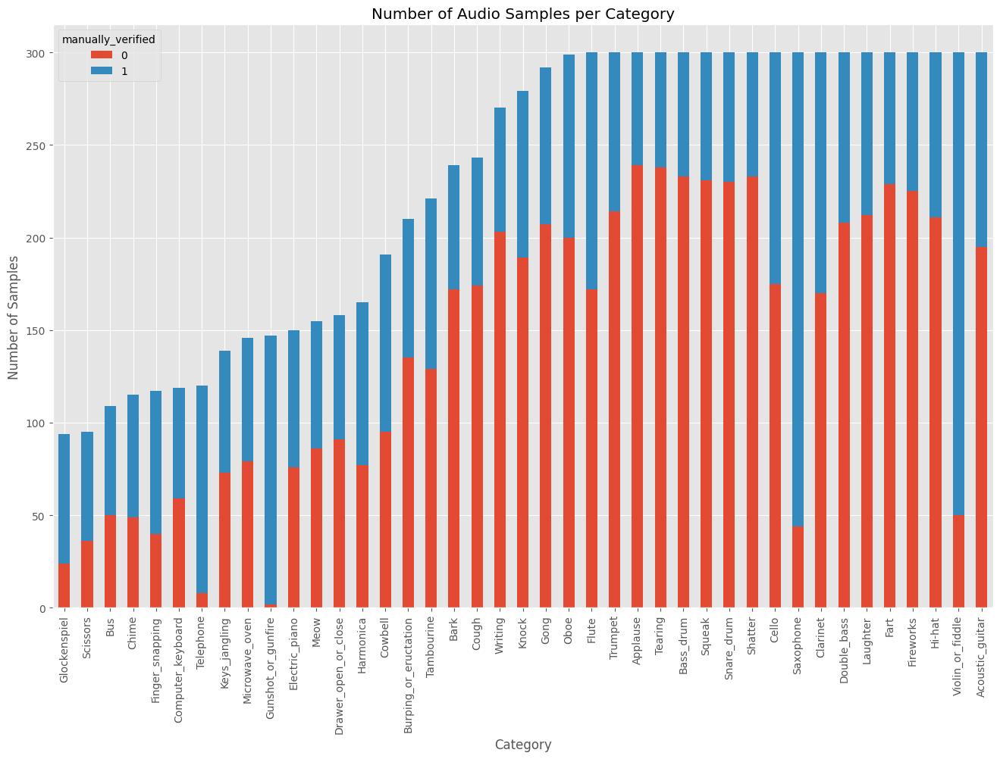

In [10]:
category_group = train.groupby(['label', 'manually_verified']).count()
sorted_data = category_group.unstack().reindex(category_group.unstack().sum(axis=1).sort_values().index)
plot = sorted_data['fname'].plot(kind='bar', stacked=True, title="Number of Audio Samples per Category", figsize=(16,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

Total samples (frames) =  (224000,)
[ 1.6097589e-04  2.7268848e-06 -7.6258910e-04 ... -4.2533535e-05
 -4.3978289e-05  8.9803571e-06]


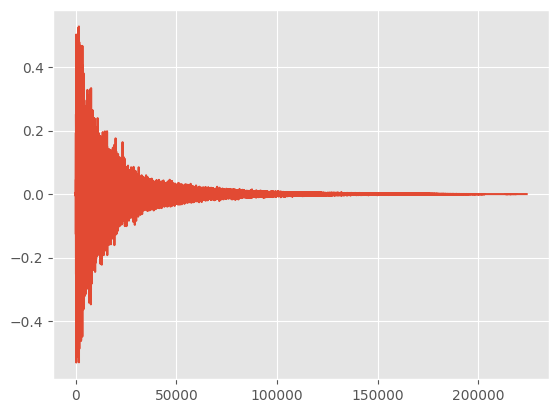

In [11]:
fname = "/content/audio-generation/dataset/FSDKaggle2018.audio_train/" + "00044347.wav"   # Hi-hat
data, _ = librosa.core.load(fname, sr=SAMPLE_RATE, res_type='kaiser_fast')
print("Total samples (frames) = ", data.shape)
print(data)
IPython.display.display(ipd.Audio(filename=fname))
plt.plot(data, '-', )
plt.show()

Shape:  (40, 63)


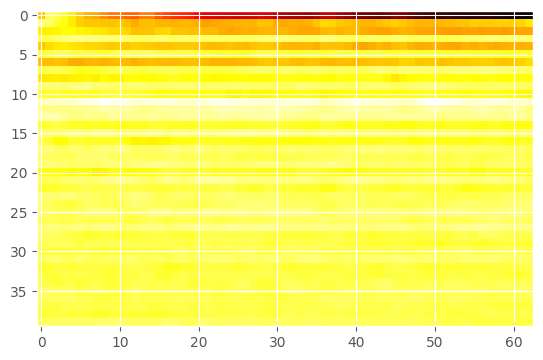

In [12]:
data = data[:2*SAMPLE_RATE]
mfcc = librosa.feature.mfcc(y=data, sr = SAMPLE_RATE, n_mfcc=40)
print("Shape: ", mfcc.shape)
plt.imshow(mfcc, cmap='hot', interpolation='nearest');

## GAN Architecture

### Discriminator

In [13]:
d = discriminator(AUDIO_SHAPE)
d.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 64000, 1)          0         
                                                                 
 conv1d (Conv1D)             (None, 9129, 32)          3232      
                                                                 
 re_lu (ReLU)                (None, 9129, 32)          0         
                                                                 
 average_pooling1d (Average  (None, 2282, 32)          0         
 Pooling1D)                                                      
                                                                 
 batch_normalization (Batch  (None, 2282, 32)          128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 2282, 32)          0

### Generator

In [14]:
g = generator(NOISE_DIM, AUDIO_SHAPE)
g.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 1000)              501000    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 1000)              0         
                                                                 
 batch_normalization_4 (Bat  (None, 1000)              4000      
 chNormalization)                                                
                                                                 
 reshape_1 (Reshape)         (None, 1000, 1)           0         
                                                                 
 conv1d_3 (Conv1D)           (None, 1000, 16)          336       
                                                                 
 re_lu_3 (ReLU)              (None, 1000, 16)          0         
                                                      

### Stacked Generator and Discriminator

In [15]:
s = stacked_G_D(g,d)
s.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 64000)             1030744   
                                                                 
 sequential (Sequential)     (None, 1)                 1193497   
                                                                 
Total params: 2224241 (8.48 MB)
Trainable params: 2219857 (8.47 MB)
Non-trainable params: 4384 (17.12 KB)
_________________________________________________________________


### Autoencoder

In [16]:
e = encoder(AUDIO_SHAPE, ENCODE_SIZE)
a = autoEncoder(e, g)
a.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 500)               2424780   
                                                                 
 sequential_1 (Sequential)   (None, 64000)             1030744   
                                                                 
Total params: 3455524 (13.18 MB)
Trainable params: 3453188 (13.17 MB)
Non-trainable params: 2336 (9.12 KB)
_________________________________________________________________


## Audio GAN

In [20]:
myGan = AudioGAN(label = LABEL)

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/adam.py:118: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Data Loaded...
Data Normalized...


### Running Autoencoder

In [21]:
start = time.time()
myGan.train_autoencoder(epochs = 10, save_internal = 2, batch = 32)
end = time.time()
total = round(end - start, 2)
print("\nExecution Time: ", total, "s")

Epoch:  0 , Loss:  [2.198791027069092, 0.0]
Epoch:  2 , Loss:  [2.6807641983032227, 0.0]
Epoch:  4 , Loss:  [1.7489458322525024, 0.0]
Epoch:  6 , Loss:  [1.2386579513549805, 0.0]
Epoch:  8 , Loss:  [1.1394106149673462, 0.0]

Execution Time:  56.0 s


In [22]:
mkdir WavFiles

In [23]:
cd WavFiles

/content/audio-generation/dataset/WavFiles


In [24]:
mkdir Autoencoder

In [25]:
mkdir GAN

In [26]:
cd ..

/content/audio-generation/dataset


In [27]:
mkdir Pictures

Original:


1/1 [==============================] - 1s 902ms/step
Result:


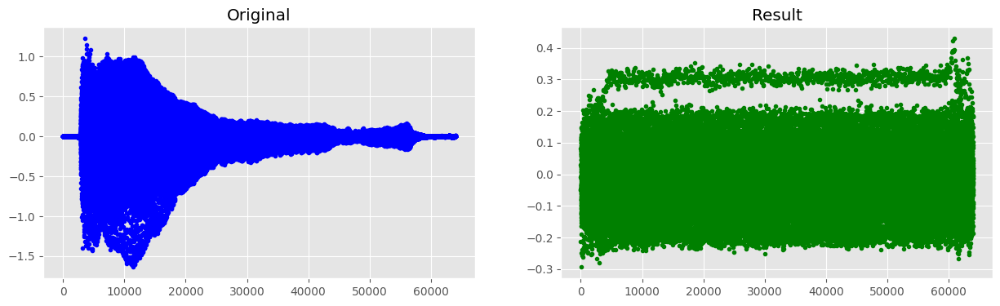

In [28]:
INDEX = 11
sample = myGan.trainData[INDEX]

print("Original:")
IPython.display.display(ipd.Audio(data = sample, rate = SAMPLE_RATE))
sf.write(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav",
                         sample, SAMPLE_RATE)
result = myGan.autoencoder.predict(sample.reshape((1,AUDIO_SHAPE))).flatten()

print("Result:")
IPython.display.display(ipd.Audio(data = result, rate = SAMPLE_RATE))
sf.write(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav",
                         result, SAMPLE_RATE)

fig      = plt.figure(figsize=(1, 2))
Original = fig.add_subplot(1, 2, 1)
Result   = fig.add_subplot(1, 2, 2)

Original.set_title('Original')
Result.set_title('Result')

Original.plot(sample, '.', color ='blue')
Result.plot(result, '.', color ='green')

plt.gcf().set_size_inches(15, 4)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "AE_Compare_" + LABEL + ".png", bbox_inches = "tight")

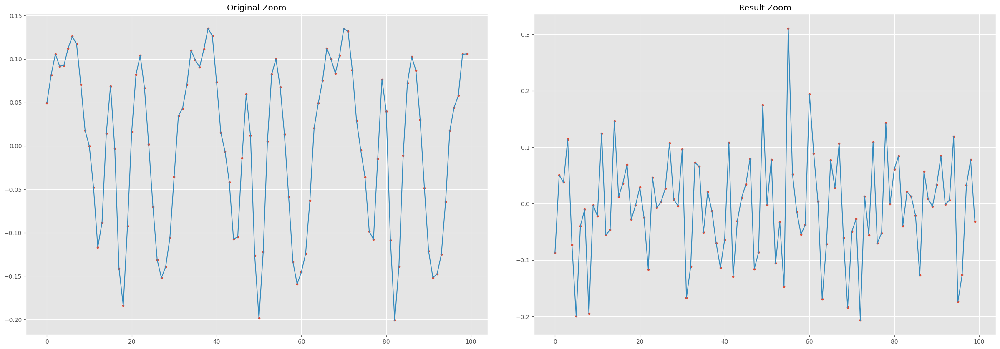

In [29]:
fig      = plt.figure(figsize=(1, 2))
OriginalZ = fig.add_subplot(1, 2, 1)
ResultZ   = fig.add_subplot(1, 2, 2)

OriginalZ.set_title('Original Zoom')
ResultZ.set_title('Result Zoom')

ZoomInit = 40000
ZoomSize = 100

OriginalZ.plot(sample[ZoomInit:ZoomInit+ZoomSize], '.')
OriginalZ.plot(sample[ZoomInit:ZoomInit+ZoomSize], '-')
ResultZ.plot(result[ZoomInit:ZoomInit+ZoomSize], '.')
ResultZ.plot(result[ZoomInit:ZoomInit+ZoomSize], '-')

plt.gcf().set_size_inches(30, 10)
plt.subplots_adjust(wspace=0.1,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "AE_CompareZ_" + LABEL + ".png", bbox_inches = "tight")

### Running GAN

1/1 [==============================] - 1s 758ms/step
epoch: 0
Discriminator_loss: 0.677161, Generator_loss: 0.691709
1/1 [==============================] - 0s 96ms/step


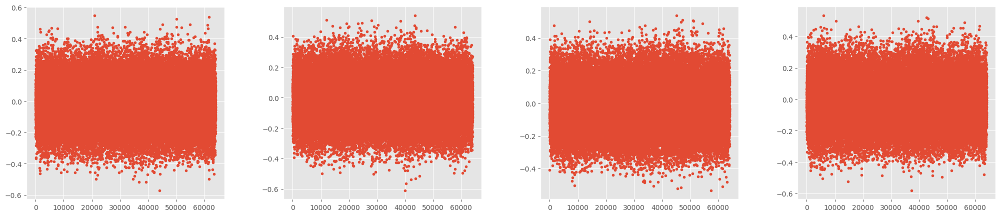

1/1 [==============================] - 0s 320ms/step
epoch: 1
Discriminator_loss: 0.623620, Generator_loss: 0.714730
1/1 [==============================] - 1s 508ms/step
epoch: 2
Discriminator_loss: 0.594459, Generator_loss: 0.758711
1/1 [==============================] - 0s 170ms/step


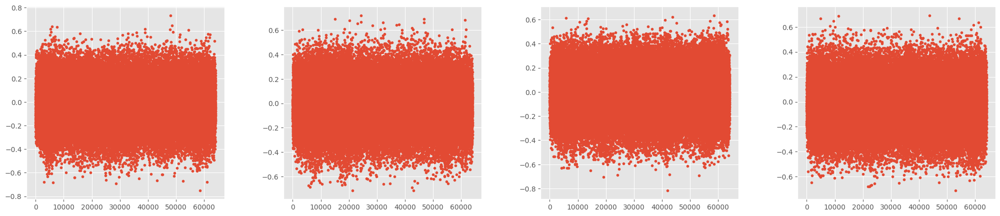

1/1 [==============================] - 0s 316ms/step
epoch: 3
Discriminator_loss: 0.588049, Generator_loss: 0.718245
1/1 [==============================] - 0s 329ms/step
epoch: 4
Discriminator_loss: 0.555497, Generator_loss: 0.692197
1/1 [==============================] - 0s 181ms/step


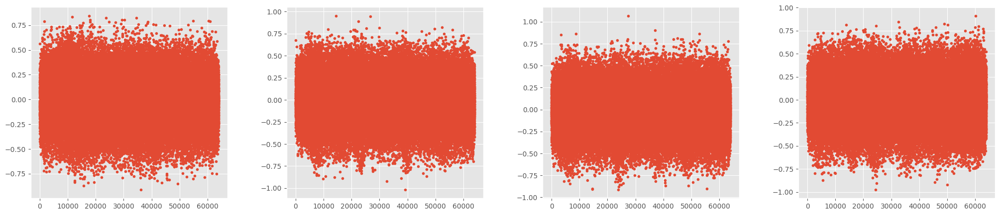

1/1 [==============================] - 1s 550ms/step
epoch: 5
Discriminator_loss: 0.525978, Generator_loss: 0.697948
1/1 [==============================] - 0s 334ms/step
epoch: 6
Discriminator_loss: 0.534464, Generator_loss: 0.657381
1/1 [==============================] - 0s 100ms/step


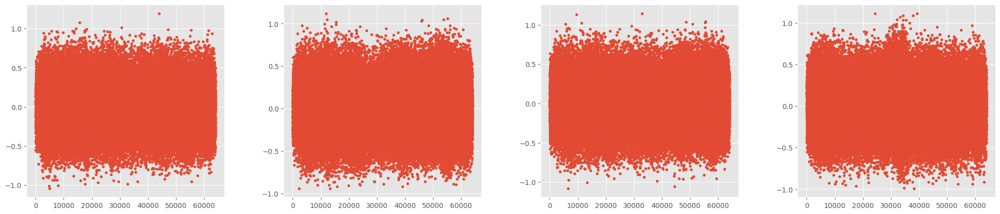

1/1 [==============================] - 0s 332ms/step
epoch: 7
Discriminator_loss: 0.515139, Generator_loss: 0.691652
1/1 [==============================] - 0s 457ms/step
epoch: 8
Discriminator_loss: 0.563647, Generator_loss: 0.725174
1/1 [==============================] - 0s 187ms/step


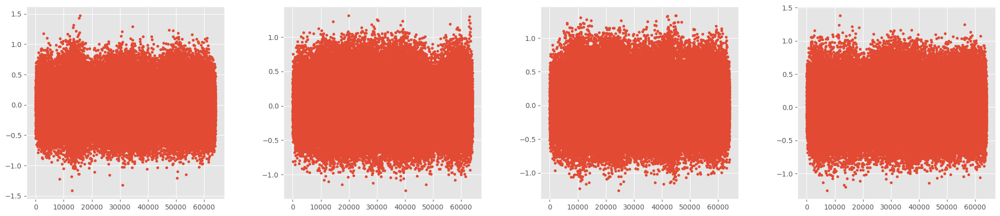

1/1 [==============================] - 1s 501ms/step
epoch: 9
Discriminator_loss: 0.516115, Generator_loss: 0.703180
Execution Time:  65.43 s


In [30]:
start = time.time()
myGan.train_gan(epochs = 10, batch = 32, save_interval = 2)
end = time.time()
total = round(end - start, 2)
print("Execution Time: ", total, "s")

### Discriminator and Generator Loss over Epochs

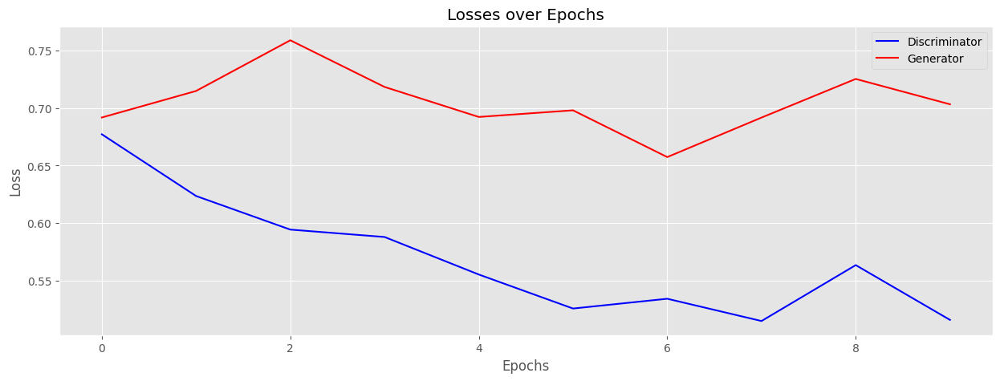

In [31]:
plt.title('Losses over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.plot(myGan.disLossHist, '-', label = 'Discriminator', color = 'blue')
plt.plot(myGan.genLossHist, '-', label = 'Generator',     color = 'red')
plt.legend(loc = 'best')

plt.gcf().set_size_inches(15, 5)
plt.savefig(PICTURE_PATH + "D_G_Loss.png", bbox_inches='tight')
plt.show()

### Test Sample

1/1 [==============================] - 0s 47ms/step


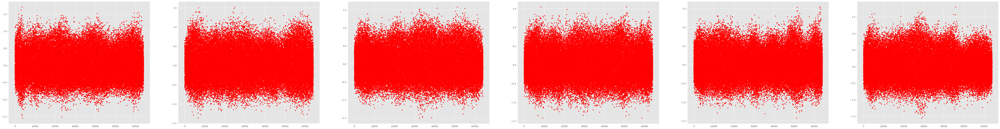

In [32]:
lin, col = 1, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))


for i in range(lin):
    for j in range(col):
        gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
        gen_test = myGan.gen.predict(gen_noise).flatten()
        #IPython.display.display(ipd.Audio(data=gen_test, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(gen_test, '.', color='red')



plt.gcf().set_size_inches(80, 10)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Generated_"+ LABEL + ".png", bbox_inches='tight')

### Original Samples

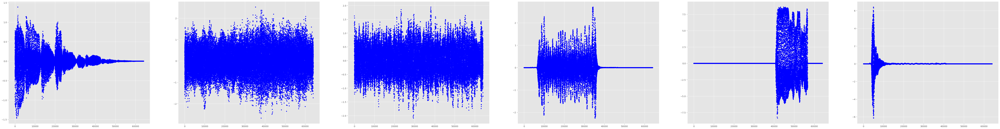

In [33]:
lin, col = 1, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))


for i in range(lin):
    for j in range(col):
        random_index = np.random.randint(0, len(myGan.trainData))
        original = myGan.trainData[random_index]
        #IPython.display.display(ipd.Audio(data=original, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(original, '.', color='blue')

plt.gcf().set_size_inches(80, 10)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Originals_"+ LABEL + ".png", bbox_inches='tight')


### Visualize Conv 1D Filters

Discriminator

Filters:  32
Kernel Size:  100
(32, 1, 100)


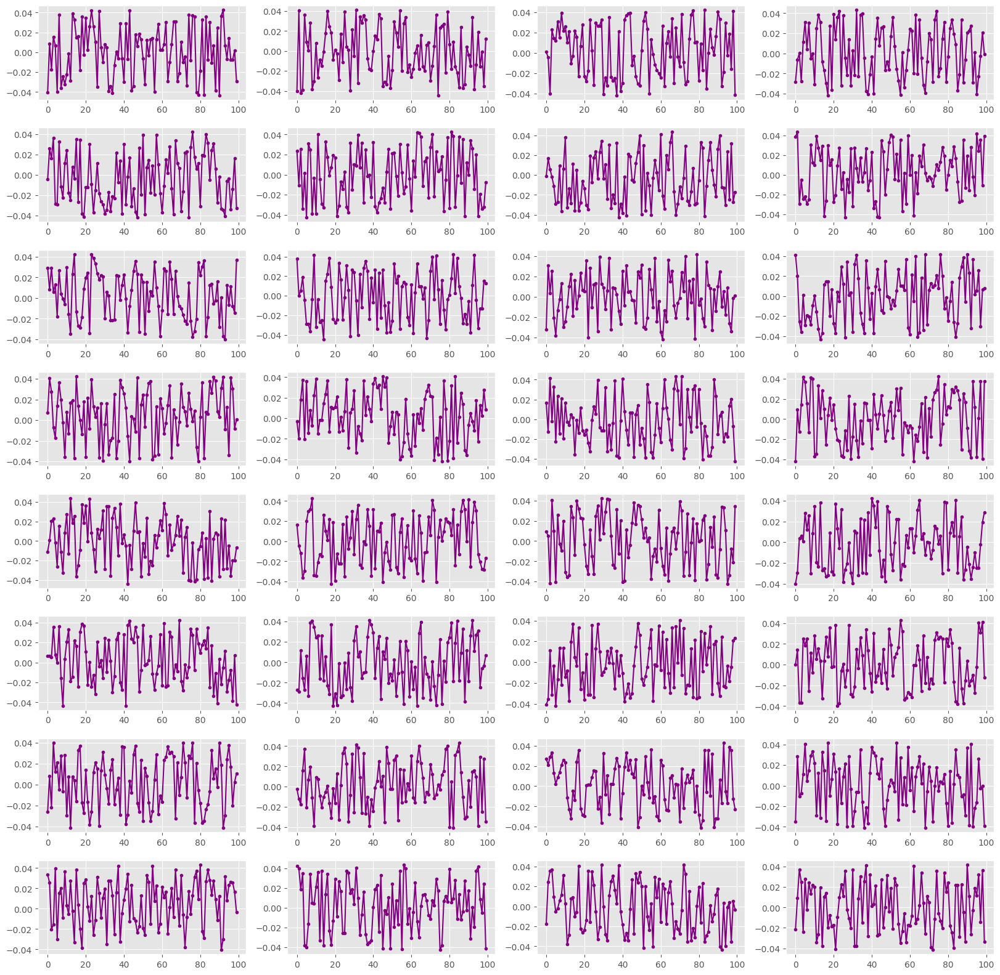

In [34]:
# Obs: lin x col = filters
lin, col = 8, 4

kernelSize = len(myGan.dis.layers[1].get_weights()[0])
filters    = len(myGan.dis.layers[1].get_weights()[0][0][0])

print("Filters: ", filters)
print("Kernel Size: ", kernelSize)

W = myGan.dis.layers[1].get_weights()[0].reshape(filters,1,kernelSize)

print(W.shape)
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))

layNum = 1
for i in range(lin):
    for j in range(col):
        convFilter = W[(i*col)+j][0]
        subPlotS[(i*col)+j].plot(convFilter, '.-', color='purple')

plt.gcf().set_size_inches(20, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()


Generator

Filters:  16
Kernel Size:  20
(16, 1, 20)


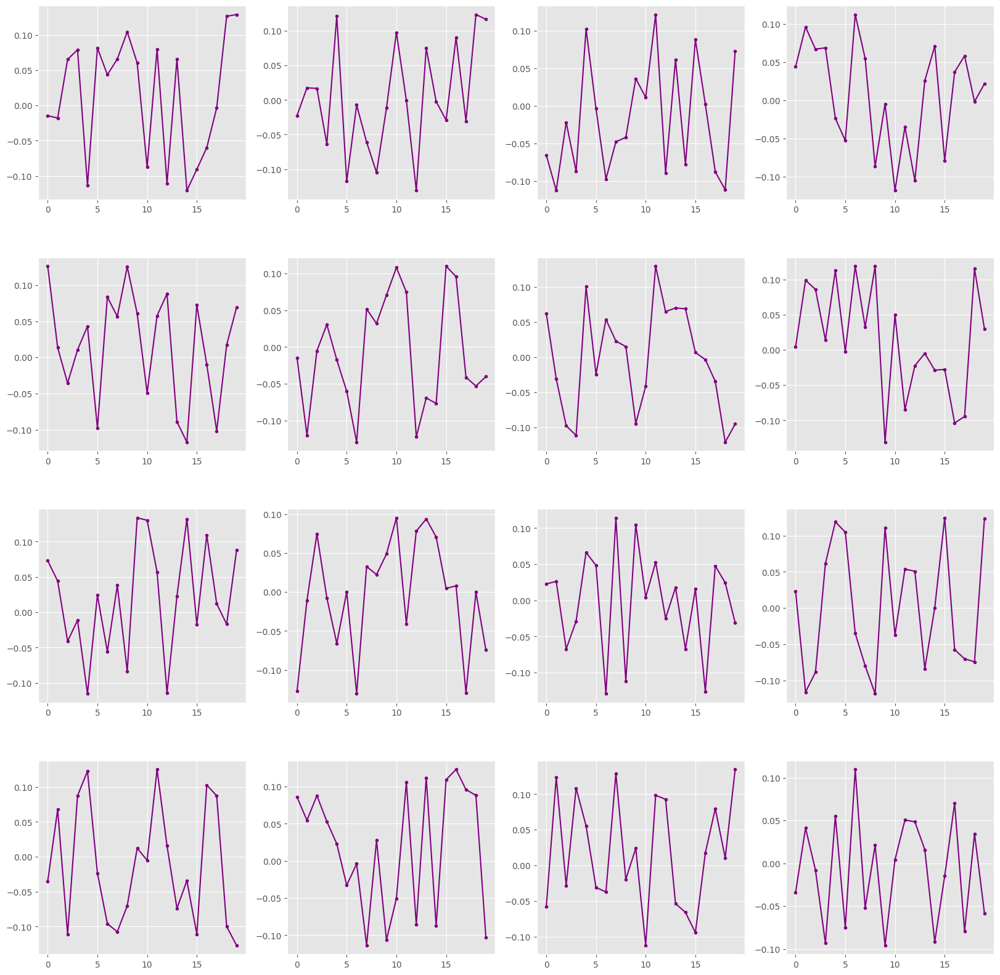

In [35]:
# Obs: lin x col = filters
lin, col = 4, 4

kernelSize = len(myGan.gen.layers[4].get_weights()[0])
filters    = len(myGan.gen.layers[4].get_weights()[0][0][0])

print("Filters: ", filters)
print("Kernel Size: ", kernelSize)

W = myGan.gen.layers[4].get_weights()[0].reshape(filters,1,kernelSize)

print(W.shape)
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))

layNum = 1
for i in range(lin):
    for j in range(col):
        convFilter = W[(i*col)+j][0]
        subPlotS[(i*col)+j].plot(convFilter, '.-', color='purple')

plt.gcf().set_size_inches(20, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()